# Real data comparison

In [1]:
%matplotlib inline

from __future__ import division

import os
import numpy as np
import scipy.sparse
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
sns.reset_defaults()

from itertools import combinations
from scipy import linalg
from scipy.io import loadmat
from sklearn.datasets import make_sparse_spd_matrix
from sklearn.model_selection import GridSearchCV, ShuffleSplit
from sklearn.utils.extmath import squared_norm
from sklearn.covariance import empirical_covariance

import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()
import plotly.io as pio

from regain.utils import error_norm

# Finance data
Here we show an example of using KLTGL for finance data. Data can be downloaded at http://quantquote.com/files/quantquote_daily_sp500_83986.zip

Once the file is downloaded, move it to this directory and unzip it. Unzip the file by clicking on it (in Windows), or by executing this command from the command line:

```bash
unzip quantquote_daily_sp500_83986.zip
```

In [ ]:
def read_financial(filename):
    df = pd.read_csv(filename, header=None, index_col=0, usecols=[0,2,3,4, 5])
    df.columns = range(4)
    df_stack = df.stack()
    df_stack.name = filename.split("/")[-1].split('_')[1].split('.')[0].upper()
    return df_stack
    
def read_all_financial(directory):
    files = [os.path.join(directory, f) for f in os.listdir(directory)]
    dfs = []
    for f in files:
        dfs.append(read_financial(f))
    return pd.concat(dfs, axis=1)

def filter_dataframe(df, companies=None, start_year=None, end_year=None, drop_na=True, log_scale=True):
    if companies is not None:
        df = df[companies]
    
    if drop_na:
        df = df.dropna()
        
    if log_scale:
        df = np.log(df)
    
    if start_year is not None:
        start_idx = [i for i, x in enumerate(df.index.get_level_values(0))
                     if str(x).startswith(str(start_year))][0]
    else:
        start_idx = 0
    if end_year is not None:
        end_idx = [i for i, x in enumerate(df.index.get_level_values(0))
                   if str(x).startswith(str(end_year))][-1] + 1
    else:
        end_idx = -1
        
    return df.iloc[start_idx:end_idx]

def filter_dataframe_months(df, companies=None, start_year=None, end_year=None, start_month=None, 
                            end_month=None, drop_na=True, log_scale=True):
    if companies is not None:
        df = df[companies]
    
    if drop_na:
        df = df.dropna()
        
    if log_scale:
        df = np.log(df)
    
    if start_year is None:
        start_idx=0
    elif start_month is None:
        start_idx = [i for i, x in enumerate(df.index.get_level_values(0))
                     if str(x).startswith(str(start_year))][0]
    else:
        start_idx = [i for i, x in enumerate(df.index.get_level_values(0))
                     if str(x).startswith(str(start_year)+str(start_month))][0]
    
    if end_year is None:
        end_idx=-1
    elif end_month is None:
        end_idx = [i for i, x in enumerate(df.index.get_level_values(0))
                   if str(x).startswith(str(end_year))][-1] + 1
    else:
        end_idx = [i for i, x in enumerate(df.index.get_level_values(0))
                   if str(x).startswith(str(end_year)+str(end_month))][-1] + 1
        
    return df.iloc[start_idx:end_idx]

def convert_df_to_data(df, T=20):
    n = int(df.shape[0] / T)
    data = [df.iloc[i*n:(i+1)*n].values for i in range(T)]
    timepoints = ['-'.join(df.iloc[i*n:(i+1)*n].index.levels[0][
        df.iloc[i*n:(i+1)*n].index.labels[0]][[0, -1]].astype(str)) for i in range(T)]
    data = np.array(data)
    return data, timepoints

In [ ]:
# df = pd.read_csv("../regain/data/finance/finance.csv", header=0, index_col=0)
df = read_all_financial('/home/fede/Downloads/quantquote_daily_sp500_83986/daily/')

In [ ]:
companies = sorted(['GOOG', 'AMZN', 'MSFT', 'DELL'])
# companies = sorted(['AMZN', 'MSFT', 'YHOO', 'IBM', 'NVDA'])
df_filter = filter_dataframe_months(
    df, companies=companies, start_year=2005, end_year=2012, end_month=None)

In [ ]:
dff = df_filter.reset_index(level=[0,1])

In [ ]:
import datetime

def to_unix_time(dt):
    epoch =  datetime.datetime.utcfromtimestamp(0)
    return (dt - epoch).total_seconds() * 1000

In [ ]:
idx = dff[0]
dff[0] = [str(dd)[:-2] + ('01' if int(str(dd)[-2:]) < 15 else '15') for dd in idx]

In [ ]:
dff = dff.groupby(by=0).mean()

In [ ]:
dateindex = [pd.Timestamp(str(x)) for x in dff.index]
idx = pd.DatetimeIndex(dateindex)

data = [go.Scatter(x=idx, y=dff[c], name=c) for c in companies]

date_list = [('2005-10-01', '2006-02-01'),
                        ('2008-10-01', '2009-02-01'),
                        ('2011-10-01', '2012-02-01'),                        
                       ]

layout = {
    'shapes': [
        # Line Vertical
        {
            'type': 'rect',
            'xref': 'x',
            'yref': 'paper',
            'x0': dates[0],
            'y0': 0,
            'x1': dates[1],
            'y1': 1,
            'fillcolor': '#d3d3d3',
            'opacity': 0.3,
            'line': {
                'width': 1,
            },
        } for dates in date_list
    ],
    'xaxis': {
        'tickformat': "%b '%y",
#         'range' : [to_unix_time(datetime.datetime(2004, 1, 1)),
#                  to_unix_time(datetime.datetime(2013, 6, 1))],
        'tickmode': 'linear', 
        'dtick': 86400000.0 * 130
    },
    'yaxis' : dict(
        type='log',
        autorange=True,
        title="Log scale"
    ),
    'width':1920,
    'height':500,
}
fig = dict(data=data, layout=layout)
py.iplot(fig)

In [ ]:
# pio.write_image(fig, "/home/fede/Dropbox (DIBRIS)/time-series-simple.png")

In [ ]:
date_list_int = [(int("".join(dd[0].split('-'))), int("".join(dd[1].split('-')))) for dd in date_list]

In [ ]:
X = []
for dint in date_list_int:
    idx = [x for x in df_filter.index.levels[0] if dint[0]< x <dint[1]]
    X.append(df_filter.loc[idx].values)

In [ ]:
data = df_filter.reset_index([0,1]).drop('level_1', axis=1)

In [ ]:
y = data[0]
X = data.drop(0, axis=1)
yy = pd.to_datetime([str(yy) for yy in y])
yyy = yy - yy[0]
labels = yyy.days.values

In [ ]:
# this for month grouping
labels = (yy.to_period('M') - yy.to_period('M')[0]).values

In [ ]:
from regainpr.covariance import kernel_latent_time_graphical_lasso_
from sklearn.gaussian_process import kernels
kltgl = kernel_latent_time_graphical_lasso_.KernelLatentTimeGraphicalLasso(
    alpha=0.06, tau=0.5,
    ker_psi_param=6,
    ker_phi_param=6,
    kernel_phi=kernels.ExpSineSquared,
    kernel_psi=kernels.ExpSineSquared, verbose=True,
    max_iter=1000).fit(X, labels)

In [ ]:
kltgl.precision_

In [ ]:
np.nonzero(kltgl.precision_)[0].size / (kltgl.precision_.shape[0] * kltgl.precision_.shape[1])

In [ ]:
from itertools import combinations

In [ ]:
cc = X.columns

In [ ]:
data = [go.Scatter(x=yy.to_period('M').to_timestamp().unique(),
                   y=kltgl.precision_[:,c[0],c[1]], name=str((cc[c[0]],cc[c[1]])))
        for c in combinations(range(len(companies)), 2)]

date_list = [
    ('2005-10-01', '2006-02-01'),
    ('2006-10-01', '2007-02-01'),
    ('2007-10-01', '2008-02-01'),
    ('2008-10-01', '2009-02-01'),
    ('2009-10-01', '2010-02-01'),
    ('2010-10-01', '2011-02-01'),
    ('2011-10-01', '2012-02-01'),
]

layout = {
    'shapes': [
        # Line Vertical
        {
            'type': 'rect',
            'xref': 'x',
            'yref': 'paper',
            'x0': dates[0],
            'y0': 0,
            'x1': dates[1],
            'y1': 1,
            'fillcolor': '#d3d3d3',
            'opacity': 0.3,
            'line': {
                'width': 1,
            },
        } for dates in date_list
    ],
    'xaxis': {
        'tickformat': "%b '%y",
        'range' : ["2009-06", "2012-03"],
        'tickmode': 'linear', 
        'dtick': 86400000.0 * 100
    },
    'yaxis' : dict(
#         type='log',
        autorange=True,
        title="Log scale"
    ),
    'width':750,
    'height':500,
}
fig = dict(data=data, layout=layout)
py.iplot(fig)

In [ ]:
from plotly import tools
from kdge import plot_plotly as pl; reload(pl);
import networkx as nx
k = -1
trace = []
graphs = []
for i, p in enumerate(ltgl.precision_ - ltgl.latent_):

    A = np.abs(p - np.diag(np.diag(p)))
#     A[A < ] = 0
    G = nx.from_numpy_matrix(A * 0.1)
    graphs.append(G)
    trace.append(pl.plot_circular(G, companies, 1.7, cmap='Blues',
                                  color_nodes=plt.rcParams['axes.prop_cycle'].by_key()['color'][:5]))

fig = tools.make_subplots(
    rows=1, cols=3, horizontal_spacing=.1, print_grid=False)

for j, tr in enumerate(trace):
    tr['data'][k]['xaxis'] = 'x' + str(j+1)
    tr['data'][k]['yaxis'] = 'y' + str(j+1)

for j, tr in enumerate(trace):
    for i, x in enumerate(tr['data']):
        col = j + 1
        x['legendgroup'] = 'group'+ str(j+1)
        x['showlegend'] = False
        fig.append_trace(x,1,col)
        


for j, tr in enumerate(trace):
    fig.layout.annotations += tuple([pl._set_ref(
        x, 'x'+ str(j+1), 'y'+ str(j+1)) for x in tr['layout']['annotations']])

    fig['layout']['xaxis'+str(j+1)].update(showgrid=False, zeroline=False, showticklabels=False)
    fig['layout']['yaxis'+str(j+1)].update(showgrid=False, zeroline=False, showticklabels=False)

py.init_notebook_mode()

fig['layout'].update(height=400, width=900,hovermode='closest')
# fig.layout.annotations += tuple([dict(
#     text="Python code: <a href='https://plot.ly/ipython-notebooks/network-graphs/'> https://plot.ly/ipython-notebooks/network-graphs/</a>",
#     showarrow=False, xref="paper", yref="paper", x=0.005, y=-0.2)])
# fig['layout'].update(scene=dict(aspectmode="data"))
py.iplot(fig)
# py.offline.iplot(fig, filename='figure_factory_subplot', image='svg')

# ccycle

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('/home/fede/Dropbox (DIBRIS)/projects/graphical models in time/kernel LTGL/exps/ccycle_data.csv', index_col=0).T
df = df.iloc[:, ~df.columns.isna()]

In [ ]:
y = df.index
X = df.values

data = [go.Scatter(x=y, y=df[c], name=c) for c in df.columns]

layout = {
    'yaxis' : dict(
        type='log',
        autorange=True,
        title="Log scale"
    ),
    'width':1920,
    'height':500,
}
fig = dict(data=data, layout=layout)
py.iplot(fig)

In [ ]:
from regainpr.covariance import kernel_latent_time_graphical_lasso_
from sklearn.gaussian_process import kernels
kltgl = kernel_latent_time_graphical_lasso_.KernelLatentTimeGraphicalLasso(
    alpha=0.06, tau=0.5,
    ker_psi_param=6,
    ker_phi_param=6,
    kernel_phi=kernels.ExpSineSquared,
    kernel_psi=kernels.ExpSineSquared, verbose=True,
    max_iter=1000).fit(X, y)

# Users

In [ ]:
user_data = pd.read_csv(
    "/home/fede/Downloads/spotify_playlists/spotify_playlists/spotify_dataset.csv",
    header=0)

In [ ]:
tags = pd.read_csv("../Lastfm-ArtistTags2007/ArtistTags.dat", delimiter="<sep>", header=0)
tags.columns = ['id','artist','genre','counts']
artist_genre = tags.groupby("id")['genre'].apply(list)

df = pd.read_csv("userid-timestamp-artid-artname-traid-traname.tsv", delimiter="\t", error_bad_lines=False, header=0)
df.columns=['userid','timestamp', 'id','artist-name','musicbrainz-track-id','track-name']

# Precipitations

In [2]:
df_sensor = pd.read_csv("/home/fede/Downloads/Sensor_readings__with_temperature__light__humidity_every_5_minutes_at_8_locations__trial__2014_to_2015_.csv")
df_sensor = df_sensor[df_sensor['location'] == 'Docklands Library']
data_sensor = df_sensor.set_index("timestamp")[['temp_avg', 'light_avg', 'humidity_avg']][:11600]
# data_sensor = df_sensor.set_index("timestamp")[['temp_avg', 'light_avg', 'humidity_avg']][:6339]
data_sensor

,temp_avg,light_avg,humidity_avg
timestamp,,,
12/15/2014 03:55:00 AM,23.5,94.8,44.5
12/15/2014 03:55:00 AM,23.5,96.3,43.1
12/15/2014 04:00:00 AM,24.2,97.6,43.4
12/15/2014 04:00:00 AM,22.9,97.8,46.6
12/15/2014 04:05:00 AM,24.5,98.2,44.5
12/15/2014 04:05:00 AM,22.9,98.0,42.9
12/15/2014 04:10:00 AM,24.5,98.2,42.6
12/15/2014 04:10:00 AM,22.6,97.6,47.3
12/15/2014 04:20:00 AM,22.9,97.0,46.9


In [3]:
datetime_index = pd.to_datetime(data_sensor.index)

In [4]:
datetime_index_hours = datetime_index.to_period('H')

y = datetime_index_hours.to_timestamp() # data_sensor.index
X = data_sensor.values

In [5]:
names_col = [x[0].capitalize() for x in data_sensor.columns.str.split('_')]
names_col = [(x if x != 'Humidity' else 'Hum') for x in names_col]

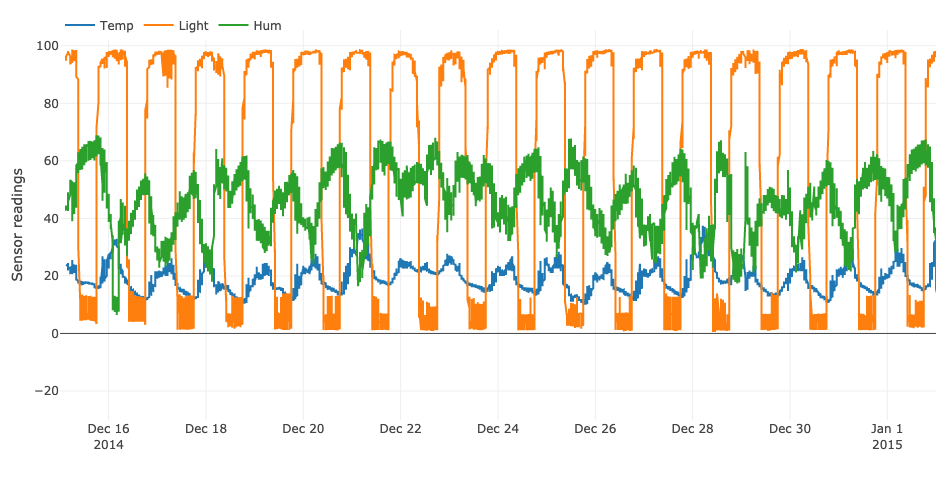

In [6]:
layout = {
        'xaxis': {
#         'tickformat': "%b '%y",
        'range' : ["2014-12-15", "2015-01-02"],
#         'tickmode': 'linear', 
#         'dtick': 86400000.0 * 100
    },
    'yaxis' : dict(
        autorange=True,
        title="Sensor readings"
    ),
    'width':1000,
    'height':500,
    'margin': {
    'l': 60,
    'r': 10,
#     'b': 5,
    't': 10,
    'pad': 0
  },
    'legend': dict(x=0, y=1.05, orientation="h")
}
fig = dict(data=[go.Scatter(
    x=y, y=data_sensor[c], name=names_col[i]) for i, c in enumerate(data_sensor.columns)],
           layout=layout)
py.iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]



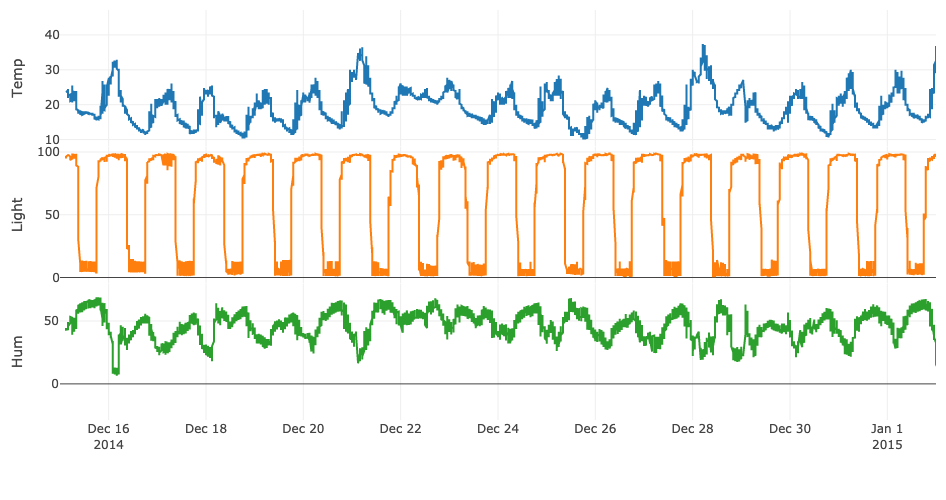

In [55]:
from plotly import tools
fig = tools.make_subplots(rows=3, cols=1, specs=[[{}], [{}], [{}]],
                          shared_xaxes=True, shared_yaxes=True,
                          vertical_spacing=0.001)
for i, c in enumerate(data_sensor.columns) :
    fig.append_trace(go.Scatter(x=y, y=data_sensor[c], name=names_col[i]), i+1, 1)

layout['showlegend'] = False
fig['layout'].update(**layout)
fig['layout']['yaxis'].update(title=names_col[0])
fig['layout']['yaxis2'].update(title=names_col[1])
fig['layout']['yaxis3'].update(title=names_col[2])
py.iplot(fig, filename='stacked-subplots-shared-xaxes')

In [57]:
pio.write_image(fig, "/home/fede/Dropbox (DIBRIS)/projects/graphical models in time/kernel LTGL/tex/images/real_3.pdf")

In [8]:
yy = y - y[0]
labels = (yy / np.timedelta64(1, 'h')).values

In [23]:
from regainpr.covariance import kernel_latent_time_graphical_lasso_
from sklearn.gaussian_process import kernels
kltgl = kernel_latent_time_graphical_lasso_.KernelLatentTimeGraphicalLasso(
#     alpha=0.1, tau=0.05,
    alpha=0.2, tau=0.2,
    kernel_phi=kernels.ExpSineSquared, ker_phi_param=24,
    kernel_psi=kernels.ExpSineSquared, ker_psi_param=24,
    verbose=True,
    max_iter=1000).fit(X, labels)

/home/fede/miniconda2/lib/python2.7/site-packages/sklearn/covariance/empirical_covariance_.py:76: UserWarning:

Only one sample available. You may want to reshape your data array

/home/fede/miniconda2/lib/python2.7/site-packages/sklearn/covariance/empirical_covariance_.py:76: UserWarning:

Only one sample available. You may want to reshape your data array

/home/fede/miniconda2/lib/python2.7/site-packages/sklearn/covariance/empirical_covariance_.py:76: UserWarning:

Only one sample available. You may want to reshape your data array

/home/fede/miniconda2/lib/python2.7/site-packages/sklearn/covariance/empirical_covariance_.py:76: UserWarning:

Only one sample available. You may want to reshape your data array



obj: 61298.8956, rnorm: 89.3040, snorm: 89.4391,eps_pri: 0.3504, eps_dual: 0.3504
obj: 64501.3643, rnorm: 61.7742, snorm: 28.7794,eps_pri: 0.3477, eps_dual: 0.3565
obj: 66544.6531, rnorm: 50.0497, snorm: 13.2857,eps_pri: 0.3466, eps_dual: 0.3615
obj: 68056.2321, rnorm: 43.1248, snorm: 9.9219,eps_pri: 0.3462, eps_dual: 0.3658
obj: 69258.8296, rnorm: 38.3689, snorm: 9.4965,eps_pri: 0.3462, eps_dual: 0.3696
obj: 70257.5289, rnorm: 34.8013, snorm: 9.9517,eps_pri: 0.3466, eps_dual: 0.3730
obj: 71110.5055, rnorm: 31.9628, snorm: 10.6699,eps_pri: 0.3472, eps_dual: 0.3762
obj: 71853.4659, rnorm: 29.6067, snorm: 11.4538,eps_pri: 0.3481, eps_dual: 0.3791
obj: 72509.9370, rnorm: 27.5876, snorm: 12.2353,eps_pri: 0.3491, eps_dual: 0.3819
obj: 73096.2431, rnorm: 25.8141, snorm: 12.9894,eps_pri: 0.3503, eps_dual: 0.3844
obj: 73624.1691, rnorm: 24.2258, snorm: 13.7073,eps_pri: 0.3516, eps_dual: 0.3868
obj: 74102.5024, rnorm: 22.7812, snorm: 14.3861,eps_pri: 0.3529, eps_dual: 0.3891
obj: 74537.9761, rn

/home/fede/src/fdtomasi/regain-private/regainpr/covariance/kernel_latent_time_graphical_lasso_.py:286: UserWarning:

Objective did not converge.



In [15]:
# data = [go.Scatter(x=sorted(y.unique()),
#                    y=np.array([linalg.pinvh(x) for x in kltgl.precision_ - kltgl.latent_])[:,c[0],c[1]],
#                    name="%s-%s" % (names_col[c[0]], names_col[c[1]]))
#         for c in combinations(range(len(data_sensor.columns)), 2)]

# layout['yaxis']["title"] = "Covariance"
# layout['legend']['y'] = 0.95
# layout['showlegend'] = True
# fig = dict(data=data, layout=layout)
# py.iplot(fig)

# pio.write_image(fig, "/home/fede/Dropbox (DIBRIS)/projects/graphical models in time/kernel LTGL/tex/images/real_covariance.pdf")

In [9]:
import matplotlib as mpl
cmap = [x['color'] for x in list(mpl.rcParams['axes.prop_cycle'])[:3]]
cmap

['#1f77b4', '#ff7f0e', '#2ca02c']

In [24]:
from regain.utils import save_pickle, load_pickle
save_pickle(kltgl, "kltgl_real_alpha0.2_tau0.2.pkl")
# kltgl = load_pickle("kltgl_real.pkl")

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x1,y2 ]
[ (3,1) x1,y3 ]



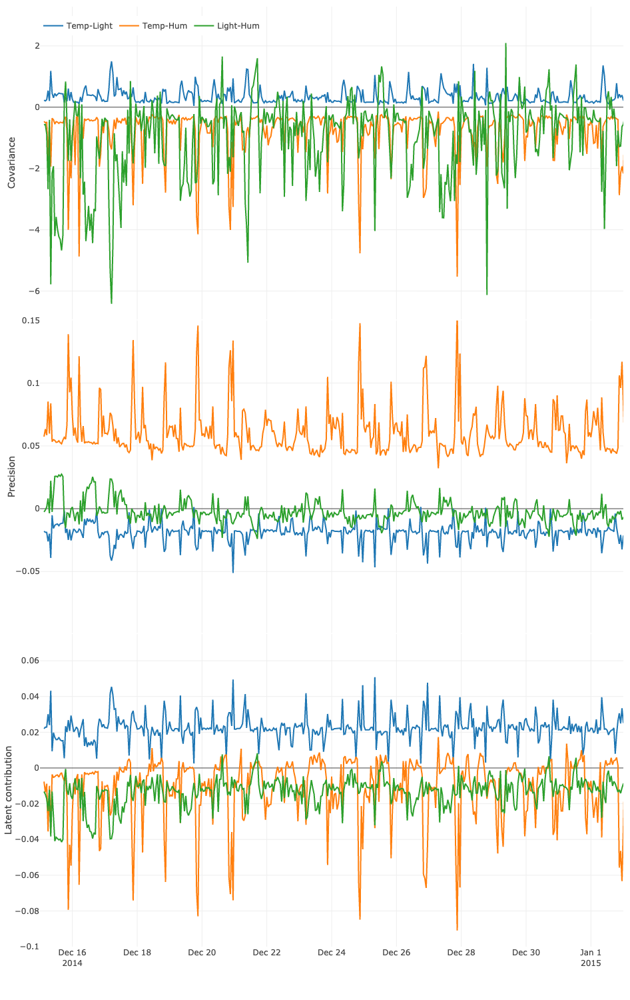

In [53]:
fig = tools.make_subplots(rows=3, cols=1, specs=[[{}], [{}], [{}]],
                          shared_xaxes=True,shared_yaxes=True, vertical_spacing=0.001)

data = [go.Scatter(
    x=sorted(y.unique()),
    y=np.array([linalg.pinvh(x) for x in kltgl.precision_ - kltgl.latent_])[:,c[0],c[1]],
    name="%s-%s" % (names_col[c[0]], names_col[c[1]]),
    line=dict(color=cmap[(int(c[0]) + int(c[1]))-1]),
    showlegend=True)
        for c in combinations(range(len(data_sensor.columns)), 2)]
for i, d in enumerate(data):
    fig.append_trace(d, 1, 1)
    
data = [go.Scatter(x=sorted(y.unique()),
                   y=kltgl.precision_[:,c[0],c[1]],
                   name="%s-%s" % (names_col[c[0]], names_col[c[1]]),
    line=dict(color=cmap[(int(c[0]) + int(c[1]))-1]),
    showlegend=False)
        for c in combinations(range(len(data_sensor.columns)), 2)]
for i, d in enumerate(data):
    fig.append_trace(d, 2, 1)
    
data = [go.Scatter(x=sorted(y.unique()),
                   y=kltgl.latent_[:,c[0],c[1]],
                   name="%s-%s" % (names_col[c[0]], names_col[c[1]]),
    line=dict(color=cmap[(int(c[0]) + int(c[1]))-1]),
    showlegend=False)
        for c in combinations(range(len(data_sensor.columns)), 2)]
for i, d in enumerate(data):
    fig.append_trace(d, 3, 1)

layout['showlegend'] = True
fig['layout'].update(**layout)
fig['layout'].update(height=1500)
fig['layout']['yaxis'].update(title='Covariance')
fig['layout']['yaxis2'].update(title='Precision',range=[-0.099,0.15])
fig['layout']['yaxis3'].update(title='Latent contribution',range=[-0.1,0.075])

layout['legend']['y'] = .99
# fig = dict(data=data, layout=layout)
py.iplot(fig)

In [54]:
pio.write_image(fig, "/home/fede/Dropbox (DIBRIS)/projects/graphical models in time/kernel LTGL/tex/images/real_all_good.pdf")

In [ ]:
# data = [go.Scatter(x=sorted(y.unique()),
#                    y=kltgl.latent_[:,c[0],c[1]],
#                    name="%s-%s" % (names_col[c[0]], names_col[c[1]]))
#         for c in combinations(range(len(data_sensor.columns)), 2)]
# layout['yaxis']["title"] = "Latent contribution"
# layout['legend']['y'] = 1.0
# fig = dict(data=data, layout=layout)
# py.iplot(fig)

# pio.write_image(fig, "/home/fede/Dropbox (DIBRIS)/projects/graphical models in time/kernel LTGL/tex/images/real_latent.pdf")